In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
def imshows(images, size=None, titles=[], clean=False, suptitle=''):
    """Show images, with titles (optional)"""

    assert isinstance(images, list), 'Images must be list'
    assert isinstance(titles, list), 'Titles must be list'
    assert len(images) != 1, 'Use imshow() instead'
    if size:
        try:
            assert isinstance(size, list) or isinstance(size, tuple)
            assert len(size) == 2
            assert len(images) == size[0] * size[1]
        except:
            raise AssertionError('Invalid size')

    if size:
        fig, axes = plt.subplots(
            size[0], size[1], figsize=(size[1]*8, size[0]*5)
        )
    else: 
        fig, axes = plt.subplots(1, len(images), figsize=(15,15))
        for i, image in enumerate(images):
            if(len(image.shape) == 3):
                axes[i].imshow(image)
            else:
                axes[i].imshow(image, plt.cm.gray)
            if titles:
                axes[i].set_title(titles[i])

    for i, (ax, image) in enumerate(zip(axes.flatten(), images)):
        if(len(image.shape) == 3):
            ax.imshow(image)
        else:
            ax.imshow(image, plt.cm.gray)
        if titles:
            ax.set_title(titles[i])
        if clean:
            ax.set_xticks([])
            ax.set_yticks([])
    if suptitle:
        plt.suptitle(suptitle)

    plt.show()

In [3]:
def imshow(image, title=''):
    """Show image, with title (optional)"""

    if(len(image.shape) == 3):
        plt.imshow(image)
    else:
        plt.imshow(image, plt.cm.gray)
    if title:
        plt.title(title)

    plt.show()

# Bài 1

In [4]:
def info(img):
    """Return info of image"""
    
    print('INFO:')
    if len(img.shape) == 3:
        print('- Ảnh màu')
        print(f'- Width: {img.shape[1]}')
        print(f'- Height: {img.shape[0]}')
        print(f'- Channel: {img.shape[2]}')
        
        R, G, B = cv2.split(img)
        print(f'  - R: Min intensity: {np.min(R)}, Max intensity: {np.max(R)}')
        print(f'  - G: Min intensity: {np.min(G)}, Max intensity: {np.max(G)}')
        print(f'  - B: Min intensity: {np.min(B)}, Max intensity: {np.max(B)}')
    else:
        print('- Ảnh xám')
        print(f'- Width: {img.shape[1]}')
        print(f'- Height: {img.shape[0]}')
        print(f'- Channel: 1')
        print(f'  - Min intensity: {np.min(img)}, Max intensity: {np.max(img)}')


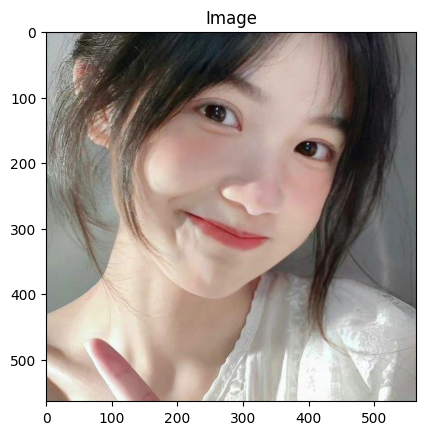

INFO:
- Ảnh màu
- Width: 564
- Height: 564
- Channel: 3
  - R: Min intensity: 1, Max intensity: 255
  - G: Min intensity: 1, Max intensity: 255
  - B: Min intensity: 0, Max intensity: 255


In [5]:
img = plt.imread('images/girl3.jpg')
imshow(img, 'Image')
info(img)

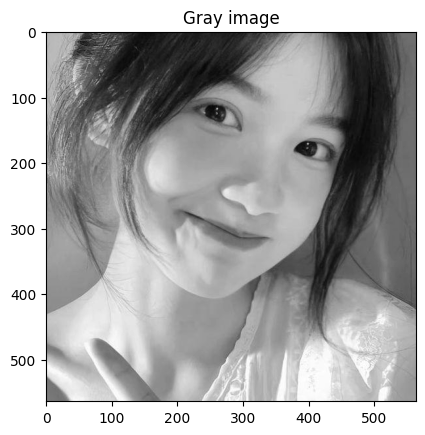

INFO:
- Ảnh xám
- Width: 564
- Height: 564
- Channel: 1
  - Min intensity: 2, Max intensity: 255


In [6]:
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
imshow(img_gray, 'Gray image')
info(img_gray)

In [7]:
def bit_plane_slicing(img):
    """Bit plane slicing"""    

    def bit_array(img) :
        array = []
        for i in range(img.shape[0]):
            for j in range(img.shape[1]):
                array.append(np.binary_repr(img[i][j], width=8))
        return array
    
    bit_plane_imgs = []
    img_bit = bit_array(img)
    for bit_plane in range(8):
        bit_plane_list = []
        for i in range(len(img_bit)):
            value = int(img_bit[i][bit_plane])
            bit_plane_list.append(value)
        reshaped_bit_img = np.reshape(bit_plane_list, img.shape)
        bit_plane_imgs.append(reshaped_bit_img) 
    return bit_plane_imgs

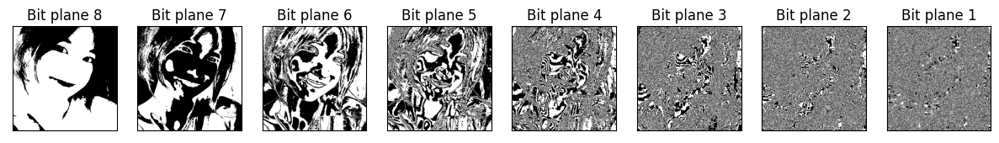

In [8]:
# Bit plane slicing for gray image
titles = [f'Bit plane {i}' for i in range(8, 0, -1)]
imshows(bit_plane_slicing(img_gray), clean=True, titles=titles)

## Image reconstructed using bit planes

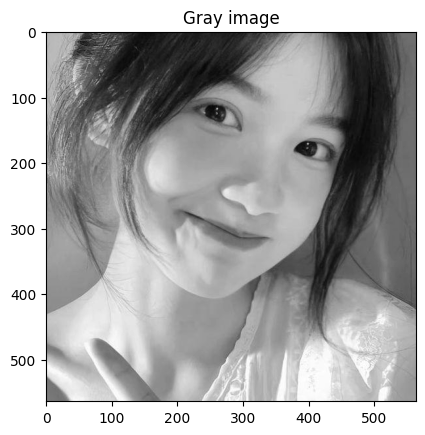

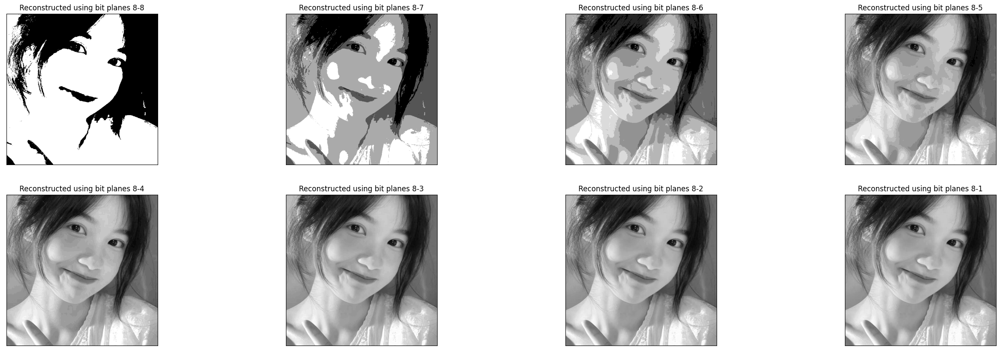

In [9]:
# Image reconstructed using bit planes
def reconstruct(img, plane):
    return img * np.power(2, plane-1)

def reconstruct_from(img, planes):
    reconstructed = 0
    for plane in planes:
        reconstructed += reconstruct(img[8-plane], plane)
    return reconstructed

gray_bit_plane = bit_plane_slicing(img_gray)

bit_planes = []
reconstructeds = []
titles = []
for i in range(8, 0, -1):
    bit_planes.append(i)
    title = f'Reconstructed using bit planes {bit_planes[0]}-{bit_planes[-1]}'
    reconstructeds.append(reconstruct_from(gray_bit_plane, bit_planes))
    titles.append(title)

imshow(img_gray, 'Gray image')
imshows(reconstructeds, titles=titles, clean=True, size=(2, 4))

$\Rightarrow$ Nhận thấy rằng ta có thể bỏ bit plane từ 1 tới 2-3 mà vẫn giữ được ảnh ở một chất lượng tốt.

## Bit plane slicing for RGB channels

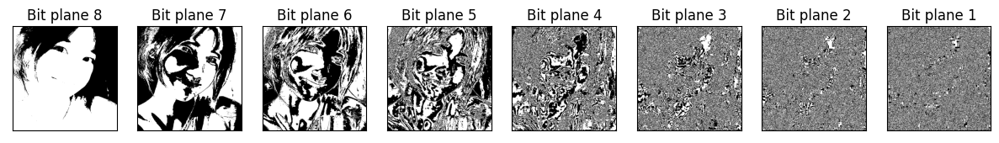

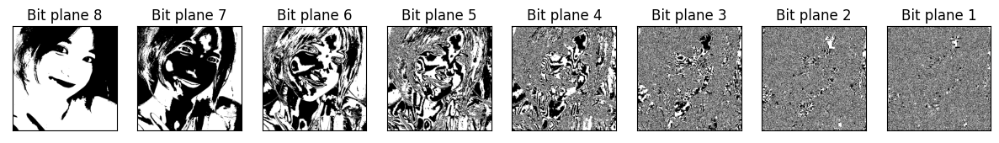

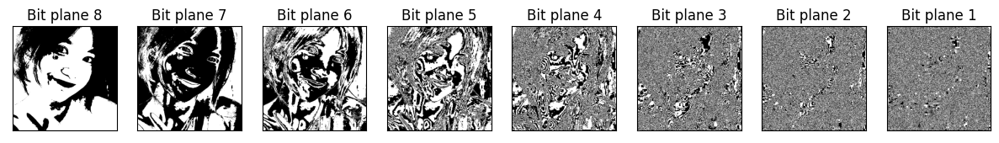

In [10]:
titles = [f'Bit plane {i}' for i in range(8, 0, -1)]
rgb_channel = cv2.split(img)
for channel in rgb_channel:
    imshows(bit_plane_slicing(channel), clean=True, titles=titles)

$\Rightarrow$ Ta nhận thấy có thể sử dụng bit plane 8 của kênh màu R (red)
để trích xuất đối tượng:

In [11]:
def get_color_by_mask(img, mask):
    mask = mask.astype(np.uint8)
    return cv2.bitwise_and(img, img, mask=mask)

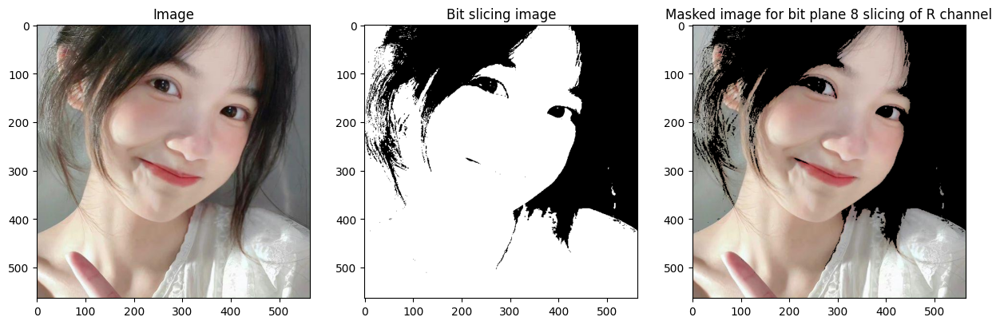

In [12]:
# Extract object using bit plane 8 of R channel
rgb_channel = cv2.split(img)
bit_mask= bit_plane_slicing(rgb_channel[0])[0]
masked = get_color_by_mask(img, bit_mask)
imshows(
    [img, bit_mask, masked],
    titles=['Image', 'Bit slicing image', 'Masked image for bit plane 8 slicing of R channel']
)

## Bit plane slicing for HSV channels

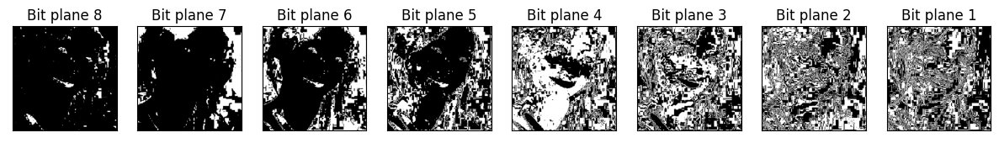

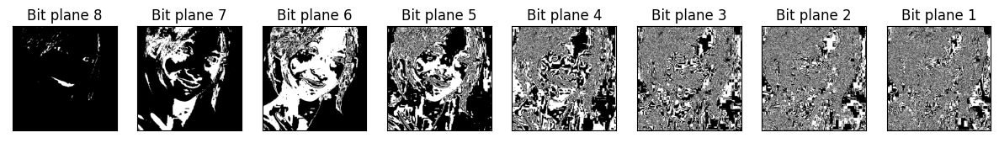

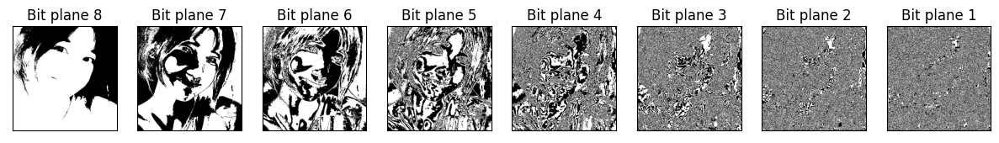

In [13]:
titles = [f'Bit plane {i}' for i in range(8, 0, -1)]
hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
hsv_channel = cv2.split(hsv_img)
for channel in hsv_channel:
    imshows(bit_plane_slicing(channel), clean=True, titles=titles)

$\Rightarrow$ Ta nhận thấy có thể sử dụng bit plane 8 của kênh màu V (value)
để trích xuất đối tượng:

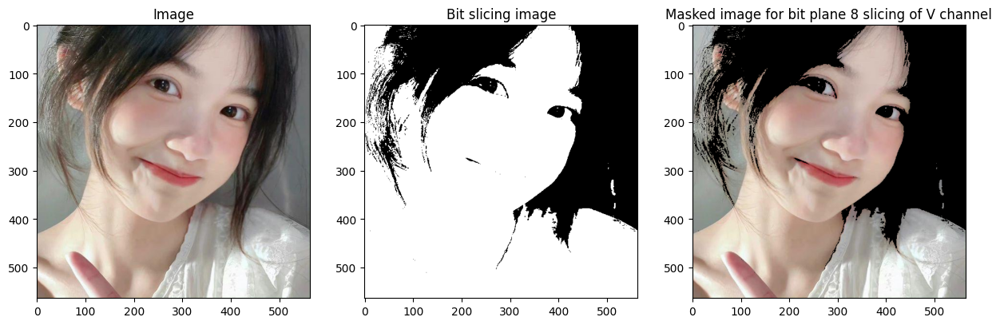

In [14]:
# Extract object using bit plane 8 of V channel
hsv_channel = cv2.split(hsv_img)
bit_mask = bit_plane_slicing(hsv_channel[2])[0]
masked = get_color_by_mask(img, bit_mask)
imshows(
    [img, bit_mask, masked], 
    titles=['Image', 'Bit slicing image', 'Masked image for bit plane 8 slicing of V channel']
)

## Steganography

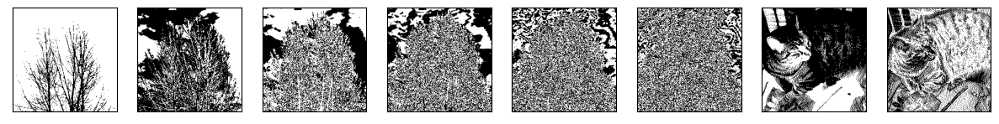

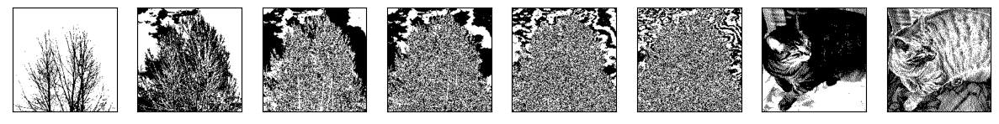

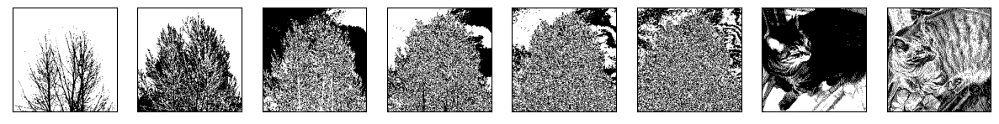

In [15]:
# Image taken from https://en.wikipedia.org/wiki/Steganography#Digital_messages
steganography = plt.imread('images/steganography.png')
steganography = (steganography * 255).astype(np.uint8)
for channel in cv2.split(steganography):
    imshows(bit_plane_slicing(channel), clean=True)

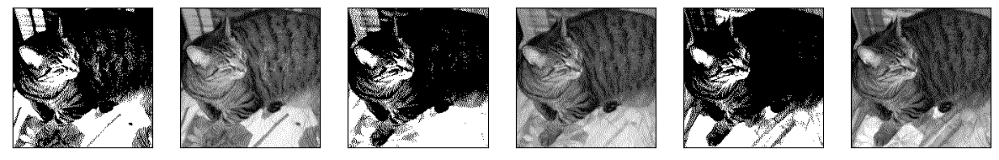

In [16]:
hidden = []
for channel in cv2.split(steganography):
    bit_plane = bit_plane_slicing(channel)

    bit_planes = []
    reconstructeds = []
    titles = []
    for i in range(2, 0, -1):
        bit_planes.append(i)
        title = f'Reconstructed using bit planes {bit_planes[0]}-{bit_planes[-1]}'
        reconstructeds.append(reconstruct_from(bit_plane, bit_planes))
        titles.append(title)

    hidden += reconstructeds

imshows(hidden, clean=True)

# Bài 2

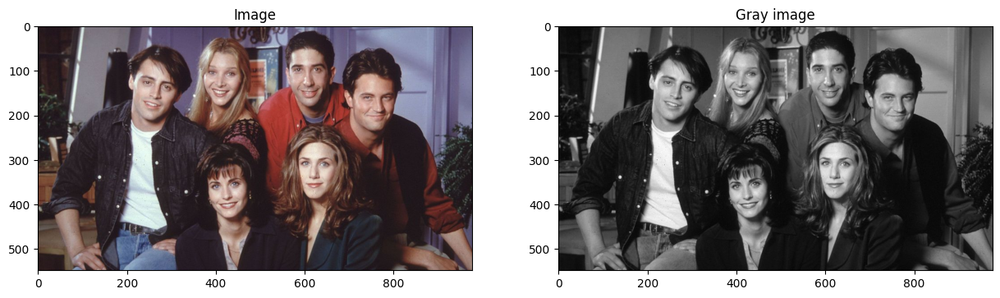

In [17]:
img = plt.imread('images/friends.jpg')
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
imshows([img, img_gray], titles=['Image', 'Gray image'])

In [18]:
def to_gray(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def show_gray(img):
    imshows(
        [to_gray(img), img],
        titles=['Gray image', 'Image']
    )

In [19]:
import dlib

def get_portrait(img):
    detector = dlib.get_frontal_face_detector()
    faces = detector(img)
    portraits = []
    for face in faces:
        left, top = face.left(), face.top()
        width, height = face.width(), face.height()
        portrait = img[top-50:top+height+50, left-50:left+width+50]
        portraits.append(portrait)
    return portraits

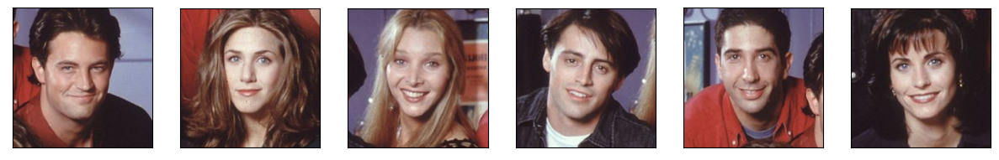

In [20]:
imshows(get_portrait(img), clean=True)

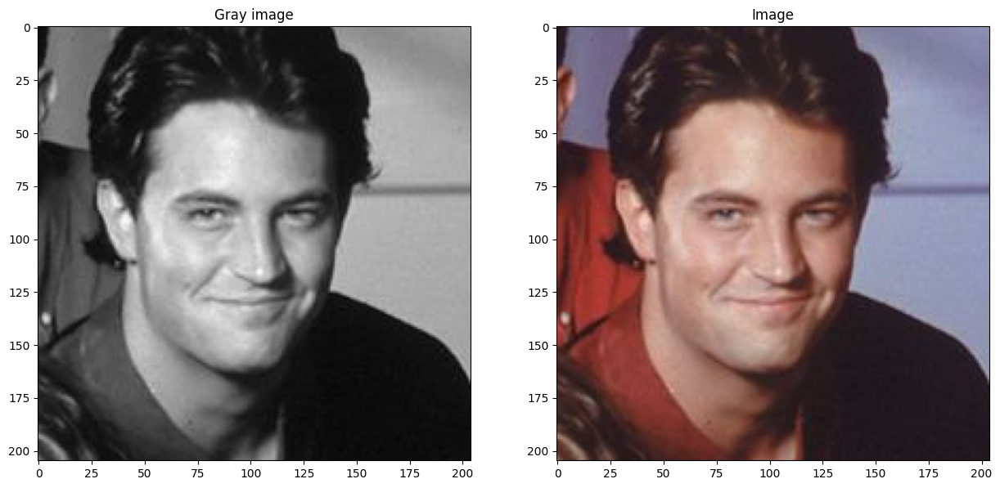

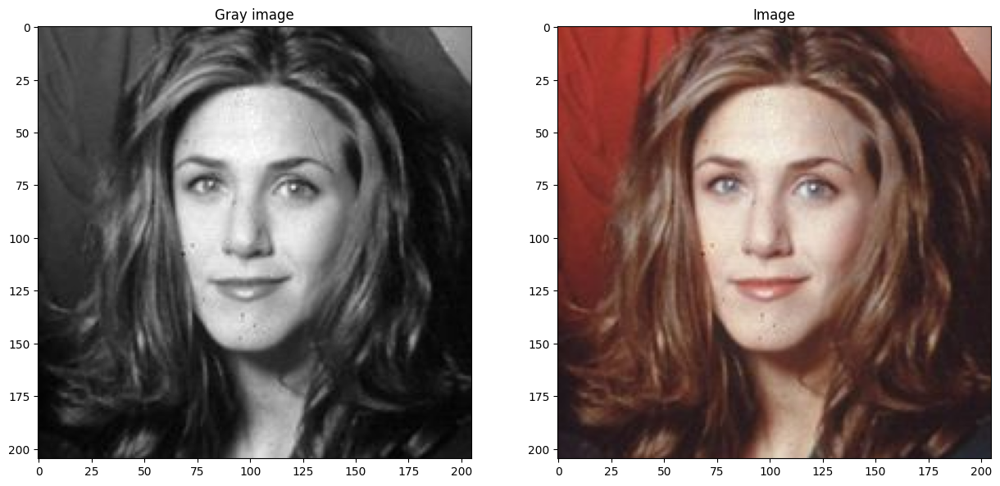

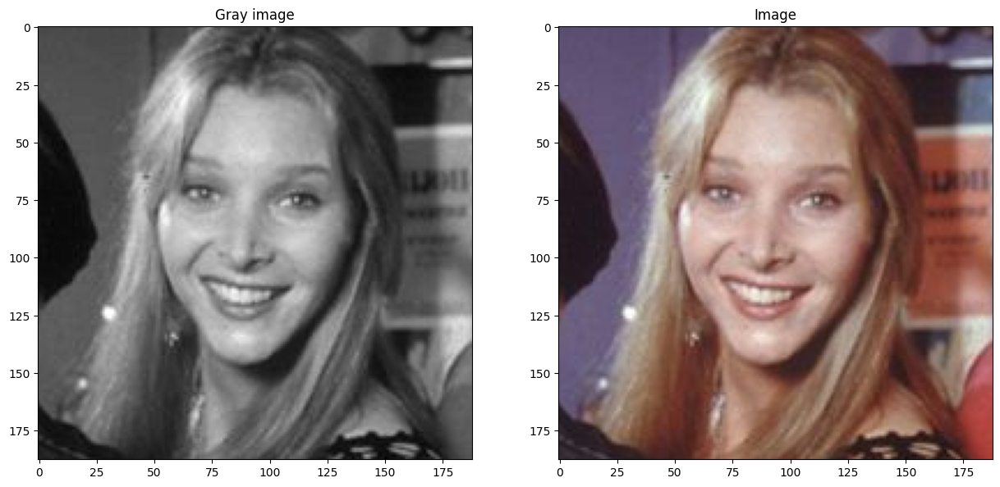

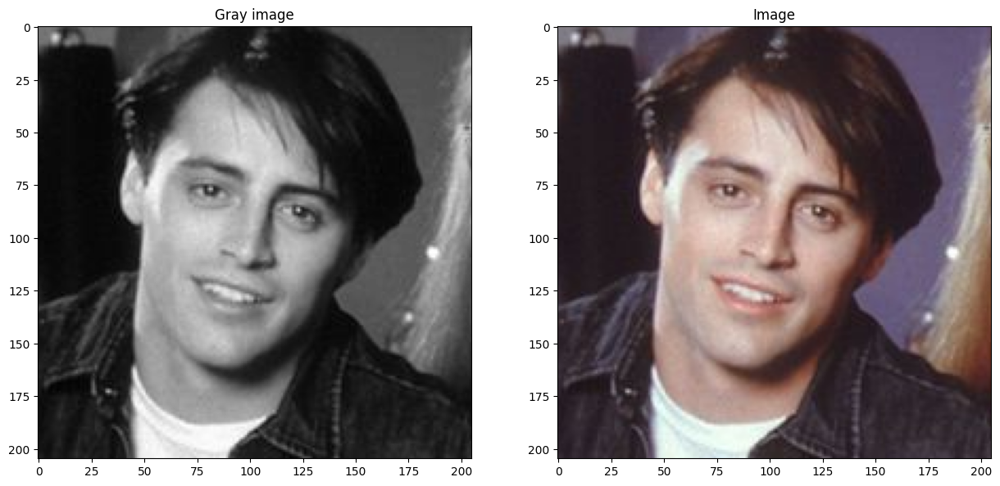

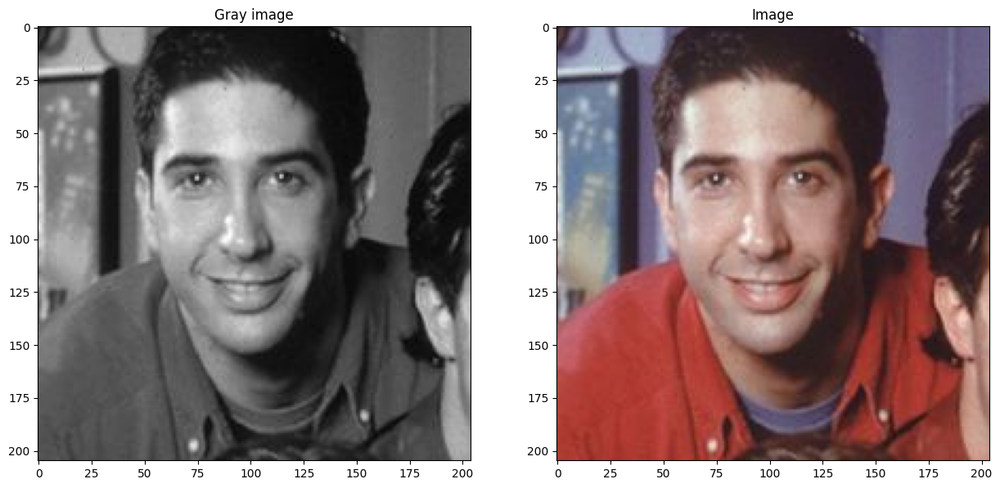

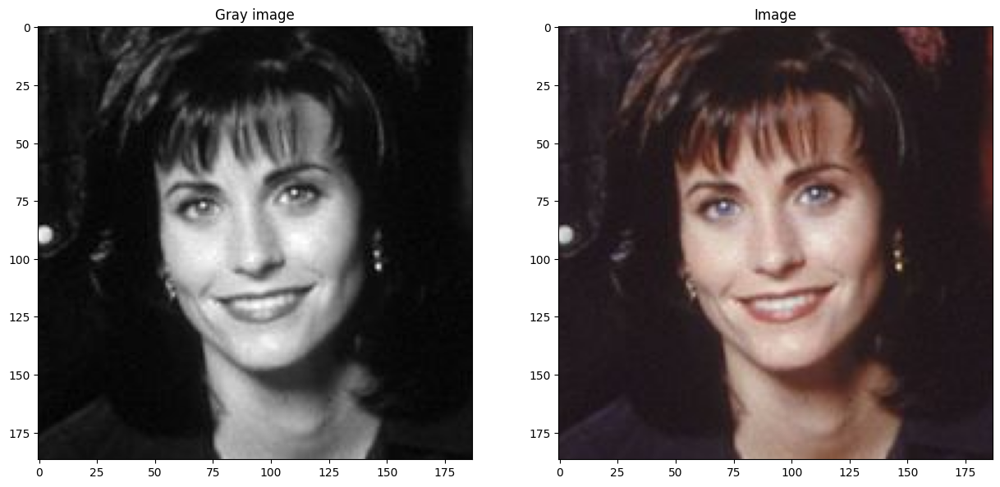

In [21]:
for portrait in get_portrait(img):
    show_gray(portrait)

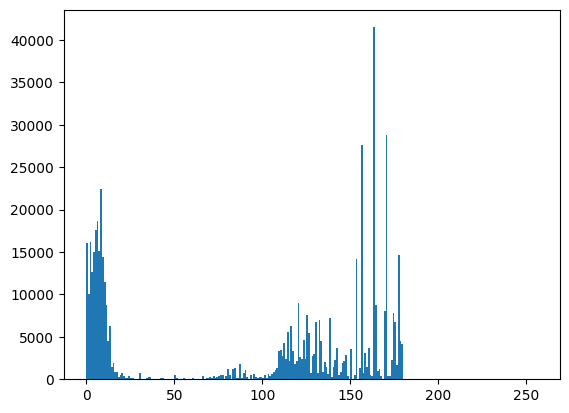

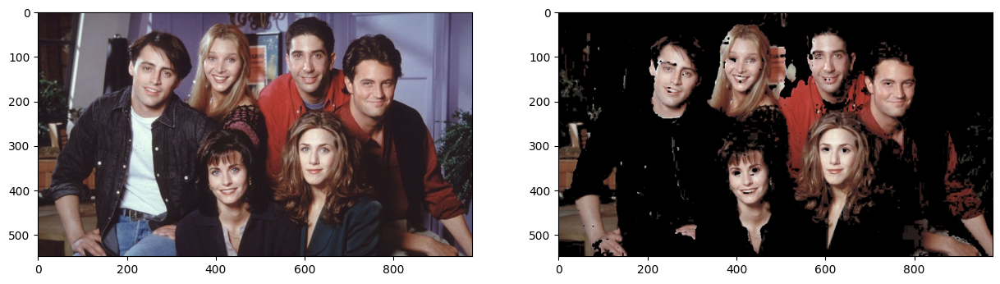

In [22]:
H, S, V = cv2.split(cv2.cvtColor(img, cv2.COLOR_RGB2HSV))
# imshows([H, S, V])
plt.hist(H.ravel(),256,[0,256])
plt.show()

lower, upper = 0, 50
mask = (H < upper) & (H > lower)
masked = get_color_by_mask(img, mask.astype(np.uint8))
imshows([img, masked])

# Bài 3

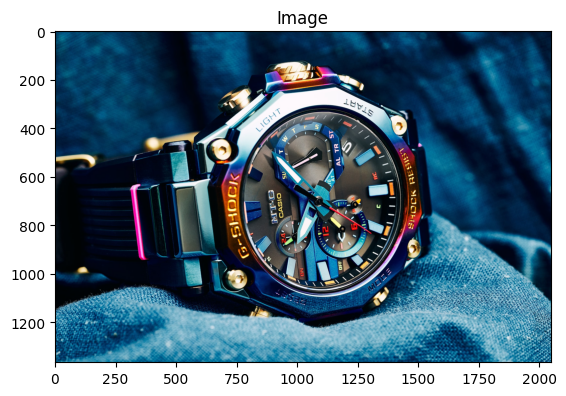

In [23]:
img = plt.imread('images/gshock.jpg')
imshow(img, 'Image')

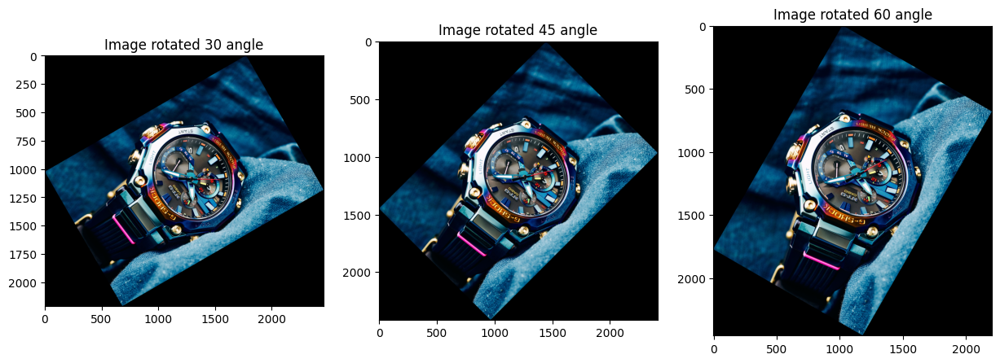

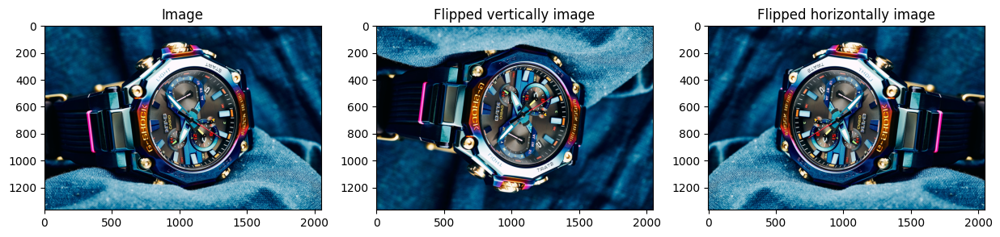

In [24]:
from skimage.transform import rotate

angles = [30, 45, 60]
rotated_imgs = [rotate(img, angle, resize=True) for angle in angles]
titles = [f'Image rotated {angle} angle' for angle in angles] 
imshows(rotated_imgs, titles=titles)

flipped_vertical_img   = np.flipud(img)
flipped_horizontal_img = np.fliplr(img)
imshows(
    [img, flipped_vertical_img, flipped_horizontal_img], 
    titles=['Image', 'Flipped vertically image', 'Flipped horizontally image']
)

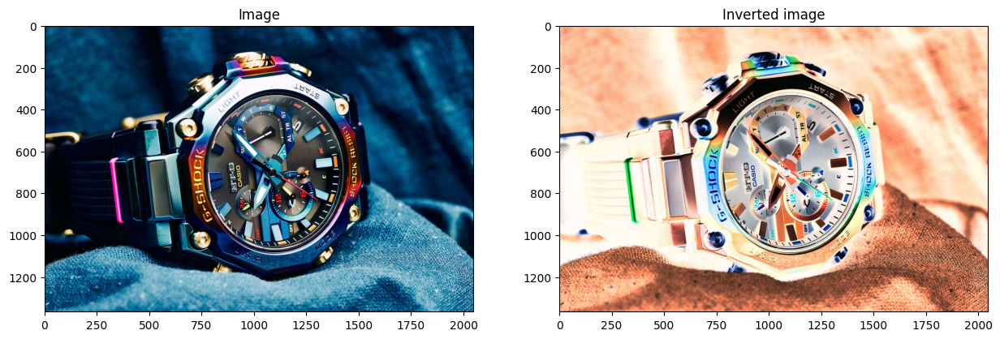

In [25]:
from skimage.util import invert

inverted_img = invert(img)
imshows([img, inverted_img], titles=['Image', 'Inverted image'])

1.0 188.0


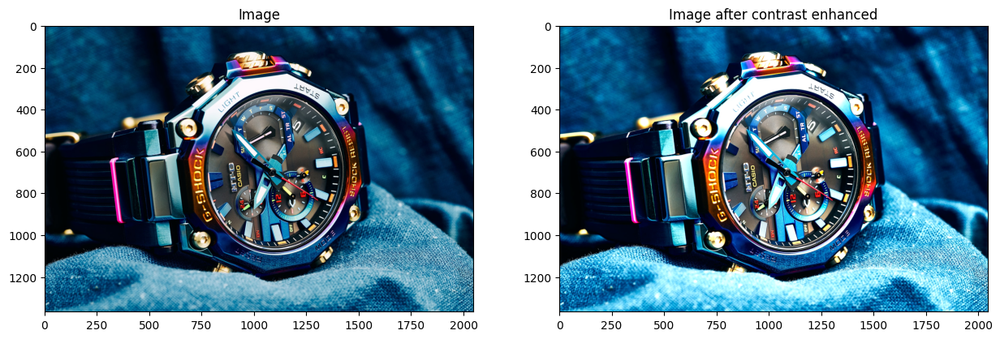

In [26]:
from skimage import exposure

# Take from 10 to 90 percent of color range
lower, upper = np.percentile(img, (10, 90))
better_contrast = exposure.rescale_intensity(img, in_range=(lower, upper))

print(lower, upper)
imshows(
    [img, better_contrast], 
    titles=['Image', 'Image after contrast enhanced']    
)

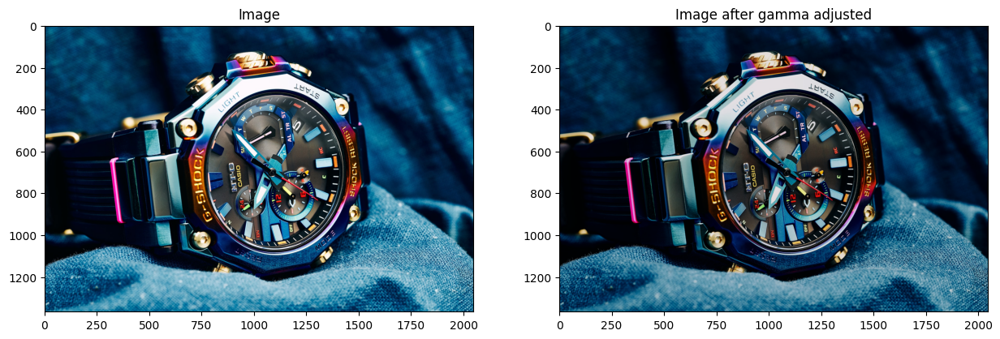

In [27]:
adjusted_gamma_img = exposure.adjust_gamma(img, gamma=1.2, gain=0.9)
imshows(
    [img, adjusted_gamma_img], 
    titles=['Image', 'Image after gamma adjusted']
)

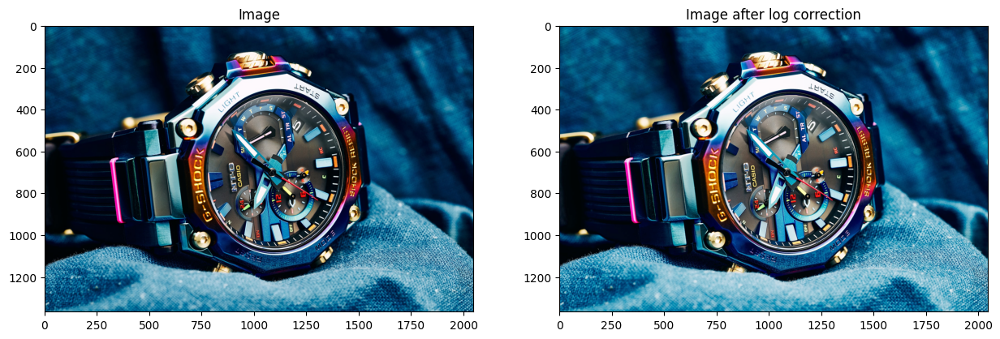

In [28]:
log_correction_img = exposure.adjust_log(img)
imshows(
    [img, log_correction_img],
    titles=['Image', 'Image after log correction']
)